# Latar Belakang
Airbnb adalah sebuah platform online yang menyediakan akomodasi untuk orang-orang yang ingin menyewa ataupun menyewakan propertinya untuk digunakan. Properti yang ditawarkan cukup beragam mulai dari berupa kamar pribadi, hotel, apartemen, villa, ataupun rumahnya. Salah satu kota yang sudah terdapat Airbnb adalah Bangkok.

Bangkok disebut sebagai kota yang paling banyak dikunjungi wisatawan selama 2022-2023 dengan jumlah sekitar 22 juta wisatawan. Saat mengunjungi Bangkok, tentunya akomodasi menjadi salah satu hal yang diperhatikan wisatawan. Menyewa akomodasi melalui Airbnb bisa menjadi pilihan wisatawan untuk menginap. Dengan banyaknya jumlah wisatawan yang datang, dapat menjadi peluang untuk memasarkan penginapan dari Airbnb. Perlu adanya pemahaman lebih lanjut oleh perusahaan mengenai persebaran dan juga kepopuleran dari listing yang dimiliki Airbnb, agar dapat memaksimalkan peluang yang ada.

Oleh karena itu, pada studi kasus ini akan menganalisa beebrapa faktor pada Airbnb di Bangkok yang nantinya diharapkan dapat membantu memberikan wawasan dan merekomendasikan beberapa hal kepada stakeholder agar dapat memaksimalkan potensi yang ada.

Source:
https://travel.okezone.com/read/2023/09/15/406/2883797/kalahkan-paris-dan-london-bangkok-kota-terbanyak-dikunjungi-turis-asing-pada-2022-2023?page=all#:~:text=BANGKOK%20dinobatkan%20sebagai%20kota%20paling%20banyak%20dikunjungi,kedua%20ada%20Paris%20dengan%20kunjungan%20sekitar%2019
https://www.ttrweekly.com/site/2024/10/airbnb-boosts-its-thailand-bookings/

# Pernyataan Masalah
Pada studi kasus ini, terdapat beberapa pernyataan masalah yang akan kita coba untuk analisis:
1. Bagaimana persebaran listing Airbnb di kota Bangkok? Distrik apa yang paling populer?
2. Bagaimana jumlah listing Airbnb berdasarkan tahun review terakhir?
3. Apa tipe kamar Airbnb di Bangkok yang menjadi pilihan pengguna?

# Stakeholder

1. **Management Airbnb**

2. **Tim Marketeing Airbnb**

# Data

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind


import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv('/Users/AXIOO/Downloads/Purwadhika/Module 2/Capstone 2/Airbnb Listings Bangkok.csv')
df_copy = df.copy()

## Data Understanding and Cleaning

Sebelum melakukan analisis, kita perlu untuk mengenal dan memahami dataset yang kita miliki dalam tahapan *data understanding*. Dari tahapan tersebut kita dapat mengetahui anomali-anomali apa saja yang ada pada dataset dan menentukan langkah-langkah yang perlu dilakukan untuk mengatasinya pada tahapan *data cleaning*.

Dataset ini bersikan informasi mengenai karakteristik properti host, lokasi, review, dan lain sebagainya. Terdapat 15 kolom dalam dataset ini, berikut penjelasan masing-masing kolom:

* `id`: Kode unik untuk setiap listing yang ada di Airbnb.

* `name`: Nama dari listing.

* `host_id`: Kode unik untuk host.

* `host_name`: Nama host (biasanya hanya nama pertama/nama depan saja).

* `neighborhood`: Lokasi listing (berdasarkan informasi latitude dan longitude).

* `latitude`: Informasi lokasi di peta (menggunakan proyeksi World Geodetic System (WGS84)).

* `longitude`: Informasi lokasi di peta (menggunakan proyeksi World Geodetic System (WGS84)).

* `room_type`: Tipe tempat tinggal yang ditawarkan (Entire home/apt, Hotel room, Private Room, Shared Room).

* `price`: Harga dari listing menggunakan nilai mata uang lokal.

* `minimum_nights`: Jumlah hari minimal untuk menyewa listing.

* `number_of_reviews`: Jumlah review yang dimiliki listing.

* `last_review`: Tanggal dari review terbaru.

* `calculated_host_listings_count`: Jumlah listing yang dimiliki host di suatu lokasi daerah.

* `availability_365`: Ketersediaan dari listing x hari kedepan.

* `number_of_reviews_ltm`: Jumlah review yang dimiliki listing dalam 12 bulan terakhir.

Berikut adalah 5 baris teratas dan terbawah beserta informasi dari dataset:


In [51]:
display(df_copy.head(), df_copy.tail())

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15849,15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15850,15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaN,NaN,14,365,0
15851,15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaN,NaN,14,365,0
15852,15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaN,NaN,14,365,0
15853,15853,790476492384199044,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.752960,100.540820,Private room,1214,1,0,NaN,NaN,14,365,0


In [52]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Unnamed: 0                      15854 non-null  int64  
 1   id                              15854 non-null  int64  
 2   name                            15846 non-null  object 
 3   host_id                         15854 non-null  int64  
 4   host_name                       15853 non-null  object 
 5   neighbourhood                   15854 non-null  object 
 6   latitude                        15854 non-null  float64
 7   longitude                       15854 non-null  float64
 8   room_type                       15854 non-null  object 
 9   price                           15854 non-null  int64  
 10  minimum_nights                  15854 non-null  int64  
 11  number_of_reviews               15854 non-null  int64  
 12  last_review                     

Dapat dilihat bahwa pada dataset ini terdapat `15854` baris dan `17` kolom. Terdapat juga informasi menganai tipe data dari masing-masing kolom.

Selanjutnya mari kita lihat deskripsi umum dari dataset.

In [53]:
display(df_copy.describe(), df_copy.describe(include='object'))

,Unnamed: 0,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,15854.000000,1.585400e+04,1.585400e+04,15854.000000,15854.000000,1.585400e+04,15854.000000,15854.000000,10064.000000,15854.000000,15854.000000,15854.000000
mean,7926.500000,1.579397e+17,1.541058e+08,13.745144,100.559903,3.217704e+03,15.292355,16.654157,0.813145,13.889618,244.378643,3.481519
std,4576.799919,2.946015e+17,1.318726e+08,0.043040,0.050911,2.497212e+04,50.815020,40.613331,1.090196,30.269848,125.843224,8.916937
min,0.000000,2.793400e+04,5.892000e+04,13.527300,100.329550,0.000000e+00,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,3963.250000,2.104509e+07,3.974431e+07,13.720090,100.529690,9.000000e+02,1.000000,0.000000,0.120000,1.000000,138.000000,0.000000
50%,7926.500000,3.503734e+07,1.224556e+08,13.738490,100.561415,1.429000e+03,1.000000,2.000000,0.435000,4.000000,309.000000,0.000000
75%,11889.750000,5.256154e+07,2.390547e+08,13.759497,100.585150,2.429000e+03,7.000000,13.000000,1.060000,13.000000,360.000000,3.000000
max,15853.000000,7.908162e+17,4.926659e+08,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,19.130000,228.000000,365.000000,325.000000


,name,host_name,neighbourhood,room_type,last_review
count,15846,15853,15854,15854,10064
unique,14794,5312,50,4,1669
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt,2022-12-11
freq,45,228,2153,8912,189


In [54]:
pd.set_option('display.max_colwidth', 1)

listItem = []
for col in df_copy.columns :
    listItem.append([col, df_copy[col].dtype, df_copy[col].isna().sum(),
                    df_copy[col].nunique(), df_copy[col].unique()]);

tabel1Desc = pd.DataFrame(columns=['Column Name', 'Data Type', 'Null', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
tabel1Desc

,Column Name,Data Type,Null,Number of Unique,Unique Sample
0,Unnamed: 0,int64,0,15854,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]"
1,id,int64,0,15854,"[27934, 27979, 28745, 35780, 941865, 1704776, 48736, 1738669, 1744248, 952677, 55681, 1765918, 55686, 59221, 959254, 62217, 1791481, 66046, 105042, 1793000, 960858, 113744, 965722, 1808600, 118118, 1816517, 969792, 121410, 145343, 973830, 156583, 1823321, 159854, 976690, 978531, 166267, 169285, 978969, 1842066, 169514, 1849029, 1862089, 985743, 988373, 172332, 1016487, 1862331, 1862377, 185364, 1887544, 1888303, 1019241, 241416, 1026451, 1028469, 1028486, 1035589, 1035640, 1897982, 296960, 1898332, 1041976, 313459, 1052180, 1926489, 320014, 1933894, 1057173, 1060320, 384924, 1067748, 1077493, 1943048, 385130, 385278, 385979, 390611, 1947314, 1079039, 1086843, 393066, 397449, 405662, 1088343, 1094136, 1961981, 407381, 1975849, 1133843, 413824, 428360, 428421, 428907, 428950, 430691, 430703, 430706, 432004, 439051, 1138679, ...]"
2,name,object,8,14794,"[Nice room with superb city view, Easy going landlord,easy place, modern-style apartment in Bangkok, Spacious one bedroom at The Kris Condo Bldg. 3, Suite Room 3 at MetroPoint, NEw Pro!! Bungalow Bkk Centre, Condo with Chaopraya River View, 1 chic bedroom apartment in BKK, Batcave, Pool view, near Chatuchak, Standard Room Decor do Hostel, Sathorn Terrace Apartment(61), 2BR apt in a cozy neighborhood, Comfy bedroom near River pier & BTS Taksin., budget hotel bangkok near subway, Deluxe Condo, Nana, Pool/GYM/Sauna, Luxury@swimpool/FreeWiFi/nearJJMkt, Nice and Quiet condo near BTS Onnut, 24Flr- 1br Apt near JJ, MRT, BTS, Central Bangkok 3 Bedroom Apartment, The Duplex - Asoke- Luxury 92sqm, New, Stylish & Luxury Studio Condo, River View - Ivy Condo (1 Bedroom), Siamese Gioia on Sukhumvit 31, Contemporary Modern Duplex-Thong Lo, Pan Dao Condo 5 min from BTS On Nut, 1 BR condominium center BKK +NETFLIX+55SQM, 1 penthouse in central Bangkok, MetroPoint Suite Room, Near Airport, Boutique Rooms Near Bangkok Airport, BangLuang House1 @ Bangkok Thailand, Studio near Chula University/Silom walk to MRT/BTS, กรองทองแมนชั่น (ลาดพร้าว 81), Deluxe one Bedroom Condo w.Pool-GYM & Sauna 8-7, Beautiful 1 BR apartment @BTS Ari, Urban Oasis in the heart of Bangkok, 1Bed apt. near Chula University/Silom, Stay at the ROARING RATCHADA!, 60 m2 apartment in Thong Lor, Bangkok, ICONSIAM River view on 49th floor, 2br apt in Sukhumvit Asoke near BTS, Self catering cozy1-bed near BTS, ❂☀☀☀Perfect Escape☀☀☀Sunny Roof EnSuite☀☀☀☀, Room with city view of BKK, BangLuang House 2@ Bangkok Thailand, Tranquility found in busy Bangkok near new skytran, Private room in Bangkok, ☞✪✪✪✪Roomy Studio 4 Family r friends✪No Stairs✪✪✪✪, ☞Downtown Central Studio-Bangkok MRT, Beautiful Wood Bangkok Resort House, ""Serviced 2 Bed Scenic SkyVillas"", Cozy 1BR rooftop (BTS Ploenchit) heart of bangkok, Chic two bedroom for Monthly rental, Sukhumvit52 near SkyTrain to BkkCBD, ♡Chic Studio, Easy Walk to Pier & BTS Taksin♡, One Bedroom Suite- WIFI- SATHORN, STUDIO RM2 - WIFI- SATHORN, Quiet Double Bed Apartment, Quiet Double Bed Apartment, Suvarnabhumi free transfer, Luxury&Comfy wthWifi walk-distance to Subwy-Malls, Apr. for rent full fur 1 bedroom, monthly, Long-stay special rate spacious entire floor Siam, One Bed Room at Sukumvit 50 Bangkok, City View, relaxed theme & delicious food around, Ideo Blucove Sukhumvit Bangkok, 2-BR condo near BTS on Sukhumvit Rd, NewlyRenovated! 3Br,SingleHouse, Park/BTS/Airport., IdeoMix, Sukhumvit RD, close to BTS, Mix Dorm Decor do Hostel, Oasis in the heart of Bangkok, 5 mins by car from Chong Nonsi BTS Sta

Berdasarkan informasi di atas, seecara umum kita dapat meelihat bahwa:
* Dataset ini terdapat 15854 baris dan 17 kolom.
* Terdapat kolom dengan nama `Unnamed: 0` yang merupakan kolom berisi index, nantinya akan kita hapus karena tidak relevan dalam proses analisis.
* Kolom `last_review` memiliki tipe data object. Berdasarkan deskripsinya, kolom ini sebaiknya memiliki tipe data date time.
* Pada kolom `price` terdapat data minimum bernilai 0, dimana hal tersebut adalah anomali karena tidak mungkin penginapan memberikan harga 0.
* Jumlah baris pada kolom `name`, `last_review`, dan `reviews_per_month` tidak sesuai dengan jumlah baris maksimum. Hal itu mengindikasikan ada data yang kosong pada kolom tersebut.
* Lokasi listing tersebar di 50 daerah yang berbeda di kota Bangkok.
* Jumlah review yang dimiliki listing bervariasi dari 0 hingga 1224

### Missing Value

Berikutnya kita akan melihat sebaran nilai yang kosong pada dataset.

In [55]:
# Jumlah missing value di setiap kolom
df_copy.isna().sum()

Unnamed: 0                        0   
id                                0   
name                              8   
host_id                           0   
host_name                         1   
neighbourhood                     0   
latitude                          0   
longitude                         0   
room_type                         0   
price                             0   
minimum_nights                    0   
number_of_reviews                 0   
last_review                       5790
reviews_per_month                 5790
calculated_host_listings_count    0   
availability_365                  0   
number_of_reviews_ltm             0   
dtype: int64

In [56]:
# Persentase missing value di setiap kolom
df_copy.isna().sum()/df_copy.shape[0]*100

Unnamed: 0                        0.000000 
id                                0.000000 
name                              0.050460 
host_id                           0.000000 
host_name                         0.006308 
neighbourhood                     0.000000 
latitude                          0.000000 
longitude                         0.000000 
room_type                         0.000000 
price                             0.000000 
minimum_nights                    0.000000 
number_of_reviews                 0.000000 
last_review                       36.520752
reviews_per_month                 36.520752
calculated_host_listings_count    0.000000 
availability_365                  0.000000 
number_of_reviews_ltm             0.000000 
dtype: float64

<Axes: >

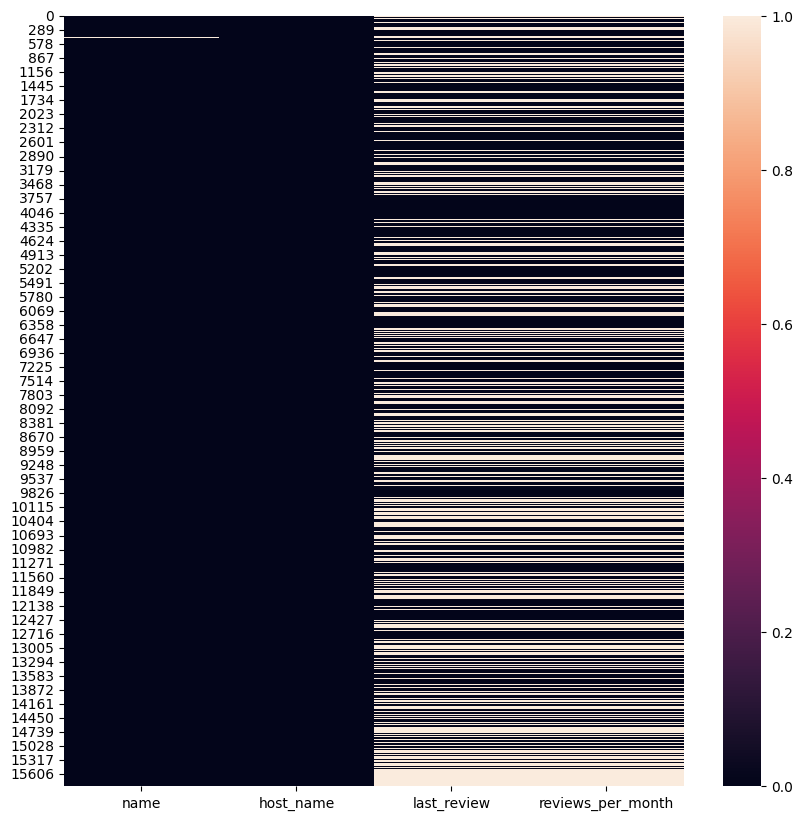

In [57]:
# Sebaran missing value di dalam data
plt.figure(figsize=(10,10))
sns.heatmap(df_copy[['name', 'host_name', 'last_review','reviews_per_month']].isna())

Secara garis besar:
* *missing value* di kolom `reviews_per_month` memiliki proporsi sangat tinggi yang sama dengan kolom `last_review`(36.520752)
* *missing value* di kolom `name` memiliki proporsi yang sangat kecil (0.050460)
* *missing value* di kolom `host_name` hanya memiliki 1 data yang hilang

Ada 2 cara untuk menangani *missing value*:
* Pertama, menghapus baris/kolom yang berisi *missing value*. Cara ini bisa digunakan untuk kolom `host_name` yang hanya memiliki 1 *missing value* dan juga kolom `name` yang sebaran *missing value* nya tidak sampai 1%. Namun, cara ini tidak disarankan apabila jumlah *missing value* tergolong cukup tinggi (pada kasus ini sampai 36%).

* Kedua, mengisi data yang hilang. Cara ini pada umumnya lebih disarankan. Kita dapat menggunakan cara ini untuk kolom `last_review` dimana kita akan isi dengan nilai yang menunjukkan tidak adanya data (bukan NaN). Kita juga bisa menggunakan cara ini pada kolom `name` yang kosong karena dapat diasumsikan bahwa nama yang kosong kesalahan input yang dapat ditolerir. 


Setelah meilihat garis besar anomali pada data, selanjutnya kita lihat setiap anomali lebih jauh.

In [58]:
# Data yang memiliki nilai kosong pada 'host_name'
no_hostname = df_copy[df_copy['host_name'].isna() == True]
no_hostname

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


Terlihat *missing value* di kolom `host_name` terdapat pada baris ke 3571 dengan nama listing Cozy Hideaway.

In [59]:
# Data yang memiliki nilai kosong pada 'name'
noname = df_copy[df_copy['name'].isna() == True]
noname

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaN,NaN,1,365,0
544,544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaN,NaN,1,365,0
572,572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaN,NaN,1,365,0
669,669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaN,NaN,1,365,0
1030,1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaN,NaN,1,365,0
1282,1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaN,NaN,1,365,0
2075,2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


Berdasarkan informasi di atas, dapat kita lihat pada kolom host_name dengan nama Diamond Bangkok dan Pakaphol memiliki nilai pada jumlah review. Hal tersebut menandakan bahwa pernah ada transaksi dan juga review pada lsiting tersebut walaupun tidak memiliki nama. Ini bisa menandakan bahwa ada kesalahan pada saat penginputan nama listing.

In [60]:
# Hubungan number_of_reviews, last_review dan reviews_per_month
df_copy[df_copy['number_of_reviews'] != 0][['number_of_reviews', 'last_review','reviews_per_month']]

,number_of_reviews,last_review,reviews_per_month
0,65,2020-01-06,0.50
3,2,2022-04-01,0.03
5,19,2017-08-03,0.17
6,1,2014-02-03,0.01
8,10,2016-03-29,0.09
...,...,...,...
15712,1,2022-12-25,1.00
15728,1,2022-12-26,1.00
15743,3,2022-12-24,3.00
15744,3,2022-12-28,3.00


In [61]:
# Hubungan number_of_reviews, last_review dan reviews_per_month
df_copy[df_copy['number_of_reviews'] == 0][['number_of_reviews', 'last_review','reviews_per_month']]

,number_of_reviews,last_review,reviews_per_month
1,0,NaN,NaN
2,0,NaN,NaN
4,0,NaN,NaN
7,0,NaN,NaN
14,0,NaN,NaN
...,...,...,...
15849,0,NaN,NaN
15850,0,NaN,NaN
15851,0,NaN,NaN
15852,0,NaN,NaN


Dari data di atas, terlihat bahwa pada kolom `last_review` dan `reviews_per_month` saling berkaitan terdapat data kosong dikarenakan listing memang belum pernah mendapatkan review (bisa dilihat dari kolom `number_of_reviews`).

Setelah melihat data dan anomali yang ada, selanjutnya kita akan menangani *missing value* dari kolom `name`, `host_name`, dan `last_review`, serta drop kolom `Unnamed`, `reviews_per_month`, dan nilai 0 pada kolom `price` karena tidak relevan untuk kebutuhan analisis pada kasus ini.

### Kolom `last_review` dan `reviews_per_month`

Kita akan mengganti data kosong pada kolom `last_review` menjadi '-'

In [62]:
# Mengisi nilai kosong pada 'last_review' menjadi '-'
df_copy['last_review'].fillna('-', inplace = True)
df_copy[df_copy['last_review'] == '-'].head()

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,-,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,-,NaN,1,365,0
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,-,NaN,3,365,0
7,7,1738669,1 chic bedroom apartment in BKK,7045870,Jiraporn,Chatu Chak,13.82925,100.56737,Entire home/apt,1461,1,0,-,NaN,1,365,0
14,14,959254,"Deluxe Condo, Nana, Pool/GYM/Sauna",5153476,Natcha,Khlong Toei,13.71516,100.56806,Entire home/apt,1400,30,0,-,NaN,1,365,0


In [63]:
# Jumlah missing value setelah penghapusan dan pengisian
df_copy['last_review'].isna().sum()

np.int64(0)

Setelah mengisi *missing value* pada kolom `last_review`, data kosong pada kolom ini sudah tidak ada.
Berikutnya kita akan drop kolom `reviews_per_month` karena tidak relevan dalam proses analisis ini.

In [64]:
# Drop kolom 'reviews_per_month'
df_copy.drop(columns=['reviews_per_month'], inplace=True)


In [65]:
df_copy.head(3)
# Kolom 'reviews_per_month' sudah terhapus

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,-,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,-,1,365,0


### Kolom `name`
Selanjutnya kita akan drop baris yang memiliki *missing value* pada kolom `name` karena sebarannya masih terhitung kecil dari keseluruhan data. Namun, untuk data yang memiliki review akan kita biarkan dan akan kita ganti *missing value* tersebut dengan 'Unknown'.

In [66]:
df_copy[df_copy['name'].isna() == True]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,-,1,365,0
544,544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,-,1,365,0
572,572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,-,1,365,0
669,669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,-,1,365,0
1030,1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,-,1,365,0
1282,1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,1,365,0
1594,1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,-,1,365,0
2075,2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,3,220,0


In [67]:
# Menghapus baris yang berisi missing value pada kolom name dan tidak memiliki review
df_copy.drop([439, 544, 572, 669, 1030, 1594], inplace=True)

In [68]:
df_copy[df_copy['name'].isna() == True]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1282,1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,1,365,0
2075,2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,3,220,0


In [69]:
# Mengisi missing value pada kolom name dengan 'Unknown'
df_copy['name'].fillna('Unknown', inplace=True)
df_copy[df_copy['name'] == 'Unknown']

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1282,1282,10000742,Unknown,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,1,365,0
2075,2075,13142743,Unknown,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,3,220,0


Setelah drop baris dan mengisi data yang kosong, sekarang sudah tidak ada *missing value* pada kolom `name`

### Kolom `host_name`
Selanjutnya untuk kolom `host_name` kita akan drop baris yang memiliki *missing value* karena hanya ada 1 saja.

In [70]:
df_copy[df_copy['host_name'].isna() == True]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,1,365,0


In [71]:
# Menghapus baris yang memiliki missing value pada kolom host_name
df_copy.drop([3571], inplace=True)

In [72]:
# Jumlah missing value setelah penghapusan
df_copy['host_name'].isna().sum()

np.int64(0)

Sudah tidak ada *missing value* pada kolom `host_name`

### Kolom `Unnamed: 0`
Kolom ini akan kita hapus karena hanya berisi index yang tidak relevan untuk kebutuhan analisis.

In [73]:
df_copy.drop(columns=['Unnamed: 0'], inplace=True)

In [74]:
df_copy.head(3)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,-,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,-,1,365,0


Kolom `Unnamed: 0` berhasil dihilangkan.

### Kolom `price`
Pada kolom ini terdapat data yang bernilai 0 yang mana itu merupakan anomali karena tidak mungkin menyewakan tempat dengan harga 0. Oleh karena itu baris yang memiliki nilai 0 tersebut akan kita hapus.

In [75]:
df_copy[df_copy['price'] == 0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,0,1,0,-,1,0,0


In [76]:
# Menghapus nilai 0 pada kolom 'price'
df_copy.drop([11103], inplace=True)

In [77]:
df_copy[df_copy['price'] == 0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365,number_of_reviews_ltm


Sudah tidak ada data dengan nilai 0 pada kolom `price`

In [78]:
# Reset index setelah menghapus data
df_copy.set_index('id', inplace = True)
df_copy.reset_index(inplace = True)

Setelah kita mengatasi beberapa anomali yang ada, mari kita cek kembali apakah masih ada *missing value* atau anomali yang tersisa.

In [79]:
# Pengecekan missing value
df_copy.isna().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
dtype: int64

In [80]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15846 entries, 0 to 15845
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              15846 non-null  int64  
 1   name                            15846 non-null  object 
 2   host_id                         15846 non-null  int64  
 3   host_name                       15846 non-null  object 
 4   neighbourhood                   15846 non-null  object 
 5   latitude                        15846 non-null  float64
 6   longitude                       15846 non-null  float64
 7   room_type                       15846 non-null  object 
 8   price                           15846 non-null  int64  
 9   minimum_nights                  15846 non-null  int64  
 10  number_of_reviews               15846 non-null  int64  
 11  last_review                     15846 non-null  object 
 12  calculated_host_listings_count  

In [81]:
# Pengecekan duplikasi data
df_copy.duplicated().value_counts()

False    15846
Name: count, dtype: int64

Dari informasi di atas, terlihat sudah tidak ada lagi *missing value*, data duplikat, maupun data anomali lainnya yang dirasa kurang relevan untuk keperluan analisis ini.

## Outliers

array([[<Axes: title={'center': 'id'}>,
        <Axes: title={'center': 'host_id'}>,
        <Axes: title={'center': 'latitude'}>],
       [<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'minimum_nights'}>],
       [<Axes: title={'center': 'number_of_reviews'}>,
        <Axes: title={'center': 'calculated_host_listings_count'}>,
        <Axes: title={'center': 'availability_365'}>],
       [<Axes: title={'center': 'number_of_reviews_ltm'}>, <Axes: >,
        <Axes: >]], dtype=object)

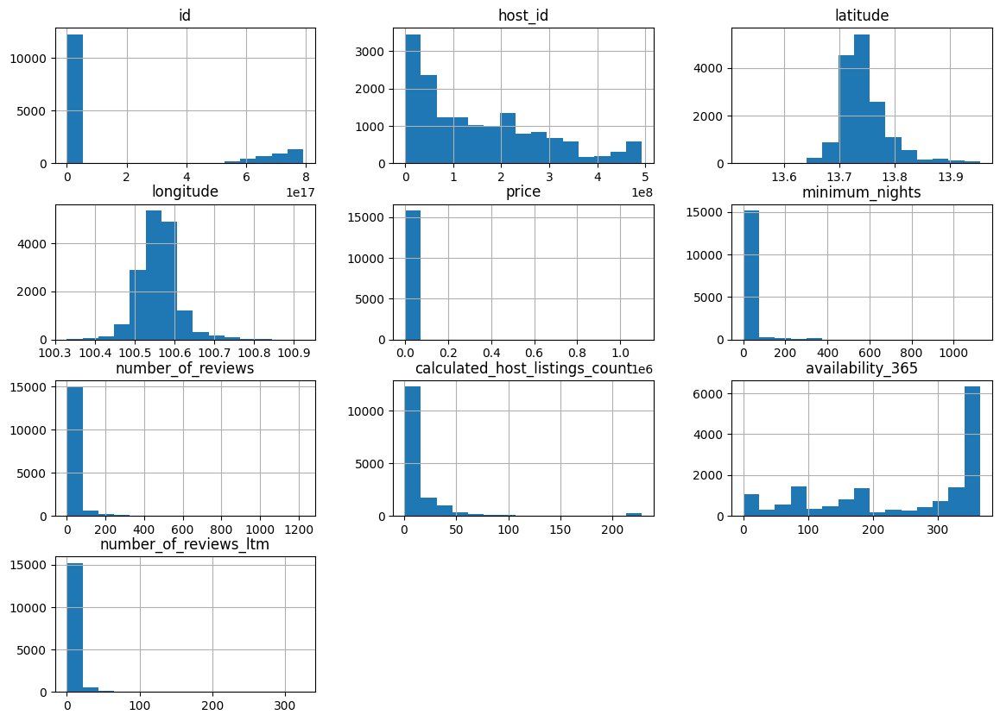

In [82]:
# Cek distribusi data pada data numerik
df_copy.hist(bins=15, figsize=(14,10))

In [83]:
df_copy.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,1.584600e+04,1.584600e+04,15846.000000,15846.000000,1.584600e+04,15846.000000,15846.000000,15846.000000,15846.000000,15846.000000
mean,1.580194e+17,1.541398e+08,13.745147,100.559893,3.218489e+03,15.299003,16.662502,13.896125,244.340780,3.483277
std,2.946545e+17,1.318742e+08,0.043043,0.050914,2.497838e+04,50.826976,40.621883,30.276103,125.834473,8.918845
min,2.793400e+04,5.892000e+04,13.527300,100.329550,2.780000e+02,1.000000,0.000000,1.000000,0.000000,0.000000
25%,2.104511e+07,3.974431e+07,13.720092,100.529675,9.000000e+02,1.000000,0.000000,1.000000,138.000000,0.000000
50%,3.504618e+07,1.224556e+08,13.738490,100.561400,1.429000e+03,1.000000,2.000000,4.000000,309.000000,0.000000
75%,5.258473e+07,2.390903e+08,13.759490,100.585138,2.429000e+03,7.000000,13.000000,13.000000,360.000000,3.000000
max,7.908162e+17,4.926659e+08,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,228.000000,365.000000,325.000000


- Berdasarkan histogram di atas, terlihat beberapa variabel berdistribusi tidak normal. Hal tersebut dapat menjadi acuan dalam menentukan metode korelasi yang akan digunakan.
- Q3 atau batas atas pada variabel **price** memiliki nilai harga `2.429000e+03(24,290)` Baht, tetapi pada maksimumnya memiliki harga `1.100000e+06(1,100,000)` Baht. Hal tersebut mengindikasikan bahwa terdapat outliers.
- Outliers juga ditemukan pada variabel **minimum_nights** dimana Q3 atau batas atasnya memiliki nilai 7 malam namun nilai maksimumnya 1125 malam.
- Informasi mengenai outliers tersebut dapat digunakan sebagai acuan untuk menggunakan median dalam analisis karena sifatnya yang tahan terhadap outliers (https://katadata.co.id/ekonopedia/istilah-ekonomi/652e11edf29dd/pengertian-mean-median-dan-modus-beserta-kelemahannya).

## Data yang sudah bersih
Kita sudah selesai membersihkan data kita, sekarang mari kita lihat sekilas informasi dari data yang sudah kita bersihkan

In [84]:
listItem = []
for col in df_copy.columns :
    listItem.append([col, df_copy[col].dtype, df_copy[col].isna().sum(),
                    df_copy[col].nunique(), list(df_copy[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'],
                     data=listItem)
print(df_copy.shape)
dfDesc

(15846, 15)


,dataFeatures,dataType,null,unique,uniqueSample
0,id,int64,0,15846,"[12523155, 42866171]"
1,name,object,0,14793,"[4 bedrooms Luxury Colonial Style Apartment, Luxury 2Bed 2bath condo, Wi-Fi, Pool, Gym, BTS!]"
2,host_id,int64,0,6651,"[13922814, 238920108]"
3,host_name,object,0,5306,"[Monalisa, Alpphy5]"
4,neighbourhood,object,0,50,"[Bang Khae, Khan Na Yao]"
5,latitude,float64,0,9602,"[13.70709, 13.75968]"
6,longitude,float64,0,10222,"[100.58439, 100.58449]"
7,room_type,object,0,4,"[Entire home/apt, Hotel room]"
8,price,int64,0,3039,"[3707, 3980]"
9,minimum_nights,int64,0,86,"[399, 60]"


Sebelum dibersihkan, data memiliki 17 kolom dan 15854 baris dengan 8 *missing value* pada kolom `name`, 1 *missing value* pada kolom `host_name`, 5790 *missing value* pada kolom `last_review` dan `reviews_per_month`, serta terdapat 1 nilai 0 pada kolom `price`.

Setelah dibersihkan, jumlah kolom berkurang menjadi 15 (menghilangkan kolom `Unnamed: 0` dan `reviews_per_month`) dan baris berjumlah 15846. Sudah tidak ada *missing value* setelah penghapusan dan pengisian data, serta tidak ada juga data yang duplikat.

#### **Simpan data ke file CSV dan Excel**

In [85]:
df_copy.to_csv('clean_airbnb_bangkok_data.csv', index=False)

In [86]:
df_copy.to_excel('clean_airbnb_bangkok_data.xlsx', index= False)

## Data Analysis
Setelah melakukan tahap data cleaning, sekarang kita akan melakukan analisis menggunakan data tersebut untuk mendapatkan wawasan lebih dalam mengenai data.

Analisis dilakukan beberapa faktor pada Airbnb agar bisa melihat gambaran dan karakteristik dari behaviour yang nantinya bisa digunakan untuk merekomendasikan strategi yang perlu dilakukan.

### Berdasarkan Lokasi

Kita akan lihat persebaran listing di setiap distrik di kota Bangkok.

In [87]:
distrik = pd.DataFrame(data=df_copy.groupby('neighbourhood').count()['id']).reset_index()
distrik.columns = ['neighbourhood', 'Jumlah_listing']
distrik = distrik.sort_values(by='Jumlah_listing', ascending=False).reset_index(drop=True)
# Jumlah listing berdasarkan distrik
distrik

,neighbourhood,Jumlah_listing
0,Vadhana,2150
1,Khlong Toei,2097
2,Huai Khwang,1125
3,Ratchathewi,1114
4,Bang Rak,827
5,Sathon,809
6,Phra Nakhon,619
7,Phra Khanong,557
8,Chatu Chak,548
9,Bang Na,457


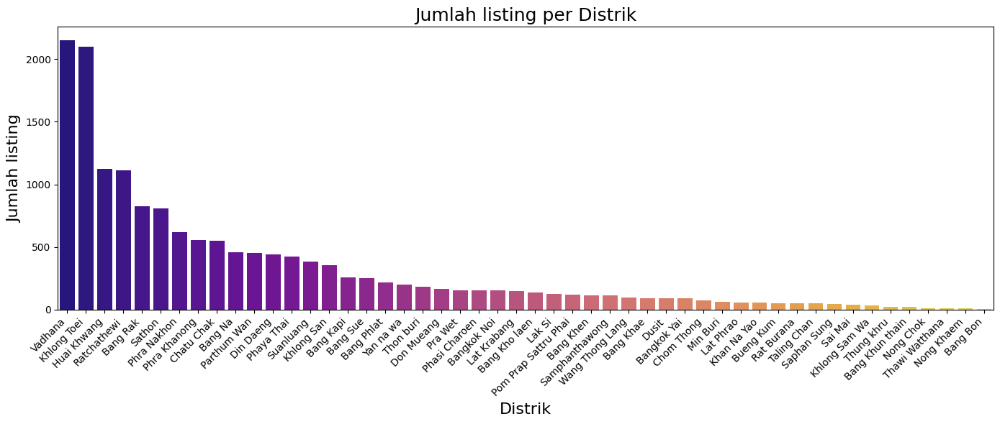

In [88]:
sort_distrik = distrik.sort_values(by='Jumlah_listing', ascending=False)

plt.figure(figsize=(14, 6))
sns.barplot(x=sort_distrik['neighbourhood'], y=sort_distrik['Jumlah_listing'], palette="plasma")
plt.title('Jumlah listing per Distrik', fontsize=18)
plt.ylabel('Jumlah listing', fontsize=16)
plt.xlabel('Distrik', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

In [89]:
import folium
bangkok = r'/Users/AXIOO/Downloads/Purwadhika/Module 2/Capstone 2/neighbourhoods.geojson'
bangkok_loc = [13.736717, 100.523186]

# Buat peta folium
m = folium.Map(location=[13.736717, 100.523186], zoom_start=10.45, tiles='CartoDB positron')

# Tambahkan Choropleth layer untuk jumlah listing per neighbourhood
folium.Choropleth(
    geo_data=bangkok,
    data=distrik,
    columns=['neighbourhood', 'Jumlah_listing'],
    key_on='feature.properties.neighbourhood',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Jumlah Airbnb Listing di Bangkok',
    highlight=True
).add_to(m)

# Tambahkan GeoJson layer buat tooltip interaktif
folium.GeoJson(
    bangkok,
    name='Neighbourhoods',
    tooltip=folium.GeoJsonTooltip(fields=["neighbourhood"], aliases=["Distrik:"])
).add_to(m)


folium.LayerControl().add_to(m)

# Tampilkan peta
m


- Penginapan (listing) sudah ada di seluruh distrik di kota Bangkok walau sebarannya tidak merata.
- Terlihat jumlah listing paling banyak berada di daerah pusat kota Bangkok.

Selanjutnya mari mita cek lokasi yang memiliki jumlah review paling banyak.

In [90]:
# Menampilkan top 10 lokasi yang memiliki jumlah review terbanyak
lokasi_review = df_copy.groupby('neighbourhood')[['number_of_reviews']].sum().reset_index()
lokasi_review.sort_values(by = ['number_of_reviews'], ascending = False, inplace = True)

top10_sum = lokasi_review.head(10)
top10_sum.set_index('neighbourhood', inplace = True)
top10_sum.reset_index(inplace = True)
top10_sum

,neighbourhood,number_of_reviews
0,Khlong Toei,41281
1,Vadhana,37415
2,Sathon,22242
3,Ratchathewi,20698
4,Huai Khwang,18145
5,Bang Rak,17654
6,Phaya Thai,13659
7,Parthum Wan,9103
8,Chatu Chak,8218
9,Phra Nakhon,8142


In [91]:
import folium

# Buat peta folium
m = folium.Map(location=[13.736717, 100.523186], zoom_start=10.45, tiles='CartoDB positron')

# Tambahkan Choropleth layer untuk jumlah listing per neighbourhood
folium.Choropleth(
    geo_data=bangkok,
    data=top10_sum,
    columns=['neighbourhood', 'number_of_reviews'],
    key_on='feature.properties.neighbourhood',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Top 10 Lokasi Berdasarkan Jumlah Review',
    highlight=True
).add_to(m)

folium.GeoJson(
    bangkok,
    name='Neighbourhoods',
    tooltip=folium.GeoJsonTooltip(fields=["neighbourhood"], aliases=["Distrik:"])
).add_to(m)

folium.LayerControl().add_to(m)

# Tampilkan peta
m


Berdasarkan gambar di atas dapat dilihat bahwa 10 lokasi listing paling populer berdasarkan review juga cenderung berada di daerah pusat kota Bangkok. Selanjutnya mari kita coba lihat lokasi yang memiliki listing paling banyak berdasarkan jumlah review dalam 12 bulan terakhir.

In [92]:
# Menampilkan top 10 lokasi yang memiliki jumlah review terbanyak dalam 12 bulan terakhir terbanyak
lokasi_review12 = df_copy.groupby('neighbourhood')[['number_of_reviews_ltm']].sum().reset_index()
lokasi_review12.sort_values(by = ['number_of_reviews_ltm'], ascending = False, inplace = True)
top10_sum12 = lokasi_review12.head(10)
top10_sum12.set_index('neighbourhood', inplace = True)
top10_sum12.reset_index(inplace = True)
top10_sum12

,neighbourhood,number_of_reviews_ltm
0,Khlong Toei,13601
1,Vadhana,9709
2,Ratchathewi,4455
3,Bang Rak,3420
4,Sathon,3232
5,Huai Khwang,2557
6,Phaya Thai,2059
7,Phra Nakhon,1799
8,Din Daeng,1756
9,Parthum Wan,1670


In [93]:
import folium

# Buat peta folium
m = folium.Map(location=[13.736717, 100.523186], zoom_start=10.45, tiles='CartoDB positron')

# Tambahkan Choropleth layer untuk jumlah listing per neighbourhood
folium.Choropleth(
    geo_data=bangkok,
    data=top10_sum12,
    columns=['neighbourhood', 'number_of_reviews_ltm'],
    key_on='feature.properties.neighbourhood',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Top 10 Lokasi Berdasarkan Jumlah Review dalam 12 Bulan Terakhir',
    highlight=True
).add_to(m)

folium.GeoJson(
    bangkok,
    name='Neighbourhoods',
    tooltip=folium.GeoJsonTooltip(fields=["neighbourhood"], aliases=["Distrik:"])
).add_to(m)

folium.LayerControl().add_to(m)

# Tampilkan peta
m


Hasil analisis lokasi yang memiliki listing paling banyak berdasarkan jumlah review dalam 12 bulan terakhir juga berada di daerah pusat kota Bangkok.

Dari hasil di atas dan ditambah dengan riset dari Google, bisa dilihat bahwa:
- Khlong Toei dan Vadhana merupakan distrik yang memiliki jumlah listing airbnb terbanyak mencapai lebih dari 2000 listing.
- Listing terbanyak juga berada di distrik Khlong Toei dan Vadhana berdasarkan jumlah review total maupun jumlah review dalam 12 bulan terakhir.
- Hal tersebut bisa disebabkan oleh faktor lokasi dimana 2 distrik tersebut berada di daerah pusat kota Bangkok yang memiliki banyak tempat-tempat menarik.
- Distrik Vadhana dikenal memiliki restoran internasional yang mewah, hotel desainer, dan kehidupan malam yang luar biasa. (https://travelseewrite-com.translate.goog/thailand-travel-guide-best-area-to-stay-in-bangkok/?_x_tr_sl=en&_x_tr_tl=id&_x_tr_hl=id&_x_tr_pto=sge#:~:text=Watthana%20is%20one%20of%20Bangkok's,high%2Dend%20shopping%20and%20nightlife.)
- Khlong Toei terkenal dengan Pasar Khlong Toei yang merupakan pasar segar terbesar di Bangkok. https://www.klook.com/id/destination/p50298697-khlong-toei-market/#:~:text=Masuki%20kekacauan%20yang%20penuh%20warna%20di%20Pasar,di%20mana%20esensi%20kehidupan%20lokal%20menjadi%20nyata.
- Selain itu, jika dilihat di Google Maps, distrik Khlong Toei dan Vadhana juga dilewati oleh jalur MRT dengan beberapa stasiun pemberhentian. (https://www.google.com/maps/place/Sukhumvit+Line/@13.7263308,100.5646168,14.25z/data=!4m6!3m5!1s0x30e29e439cc818c1:0x14d47daf0881de90!8m2!3d13.7283528!4d100.5726823!16s%2Fg%2F11y6pcpxlj!5m1!1e2?entry=ttu&g_ep=EgoyMDI1MDUxMS4wIKXMDSoASAFQAw%3D%3D)

### Berdasarkan Last Review

In [94]:
# Hitung jumlah listing per tanggal last_review
df_line = df_copy.groupby('last_review')['id'].count().reset_index()
df_line.columns = ['last_review', 'count']
df_line1=df_line[df_line['last_review']>'2014-12-31']

# Buat line chart
fig = px.line(df_line1,
              x='last_review',
              y='count',
              title='Jumlah Listing Berdasarkan Last Reviewe (Date)'
              )

fig.update_layout(
    xaxis_title='Tanggal Last Review',
    yaxis_title='Jumlah Listing',
    showlegend=False,
    autosize=False,
    width=1100,
    height=600,
    xaxis=dict(
        tickformat='%Y',
        dtick='M12'
    )
)

fig.update_traces(
    hovertemplate='<b>Tanggal:</b> %{x|%Y-%m-%d}<br><b>Jumlah Listing:</b> %{y}<extra></extra>'
)

fig.show()

- Dari data yang ada, kenaikan dan penurunan jumlah review hingga tahun 2018 cenderung terlihat stabil.
- Pada awal tahun 2019 sempat ada lonjakan jumlah review walau tidak terlalu signifikan.
- Awal tahun 2020 terjadi lonjakan kembali yang cukup tinggi pada awal tahun 2020, namun selanjutnya mulai mengalami penurunan yang signifikan hingga tahun berikutnya (2021). Hal ini mungkin terkait dengan masa pandemi COVID-19 yang berdampak pada banyak sektor termasuk pariwisata. (https://www.kompas.id/baca/internasional/2021/01/20/pariwisata-thailand-yang-terdampak-covid-19)
- Pada tahun 2022 perlahan mulai terlihat peningkatan yang signifikan dari jumlah review. Hal tersebut bisa menjadi indikasi bahwa sektor pariwisata yang perlahan mulai pulih setelah terdampak pandemi.  

### Berdasarkan Room Type

In [95]:
# Hitung jumlah masing-masing room_type
room_counts = df_copy['room_type'].value_counts()

# Buat pie chart
fig = px.pie(room_counts, 
             names=('Entire home/apt', 'Private room', 'Hotel room', 'Shared room'),
             values='count',
             title='Proporsi Tipe Kamar Airbnb di Bangkok',
             hover_data=['count'])

fig.update_traces(textinfo='percent+label')  # Tampilkan persentase & label

fig.update_layout(
    autosize=False,
    width=800,
    height=450)

fig.update_traces(
    hovertemplate='<b>Tipe Kamar:</b> %{label}<br>' +
                  '<b>Jumlah Listing:</b> %{value}<br>'
)

fig.show()

- Berdasarkan informasi tersebut menunjukkan bahwa **'Entire home/apt'** merupakan tipe kamar yang paling banyak dengan persentase sekitar 56.2% dari total lisitng Airbnb yang ada di Bangkok.
- Tipe kamar yang paling banyak kedua adalah **'Private room'** dengan persentase sekitar 36.4% dari total lisitng.
- Tipe kamar **'Hotel room'** (sekitar 4.09%) dan **'Shared room'** (sekitar 3.3%) memiliki proporsi yang sanngat kecil dari total listing.

Selanjutnya mari kita cek sebaran tipe kamar di 10 distrik yang paling populer.

In [96]:
# Hitung total review per neighborhood
top_neighbourhoods = (
    df_copy.groupby('neighbourhood')['number_of_reviews']
    .sum()
    .sort_values(ascending=False)
    .head(10)
    .index
)

# Filter data hanya untuk 10 neighborhood teratas
filtered_df = df_copy[df_copy['neighbourhood'].isin(top_neighbourhoods)]

# Hitung jumlah room_type per neighbourhood
grouped_data = filtered_df.groupby(['neighbourhood', 'room_type']).size().reset_index(name='count')

# Buat stacked bar chart
fig = px.bar(grouped_data, 
             x='neighbourhood', 
             y='count', 
             color='room_type',
             title='Sebaran Tipe Kamar di 10 Distrik dengan Review Terbanyak',
             hover_data=['count'],
             text_auto=True)

# Tambahkan dropdown filter room_type (opsional)
room_types = grouped_data['room_type'].unique().tolist()

# Tambahkan filter interaktif ke layout
fig.update_layout(
    updatemenus=[
        {
            'buttons': [
                {
                    'method': 'update',
                    'label': 'Semua',
                    'args': [{'visible': [True]*len(room_types)}]
                }
            ] + [
                {
                    'method': 'update',
                    'label': rt,
                    'args': [{'visible': [i == idx for i in range(len(room_types))]}]
                } for idx, rt in enumerate(room_types)
            ],
            'direction': 'down',
            'showactive': True,
            'x': 1.003,
            'y': 1.17
        }
    ]
)


fig.update_layout(
    barmode='stack',
    autosize=False,
    xaxis_title= 'Distrik',
    yaxis_title= 'Jumlah',
    legend_title_text='Tipe Kamar',
    width=1100,
    height=500)

# Tampilkan chart
fig.show()

- Grafik tersebut menunjukkan bahwa tipe kamar **'Entire home/apt'** juga memiliki proporsi yang sangat besar di hampir semua distrik yang memiliki jumlah review paling banyak.
- Tipe kamar **'Private room'** bisa dimaksimalkan pada distrik Bang Rak dan Phra Nakhon karena memiliki proporsi yang lebih besar dari tipe kamar yang lain.
- Untuk tipe kamar **'Shared room'** memiliki jumlah yang sangat sedikit pada semua distrik.

Selanjutnya mari kita lihat jumlah review pada masing-masing tipe kamar di 10 distrik terpopuler.

In [97]:
# Hitung total review per room_type per neighborhood
review_per_neigh_room = (
    filtered_df.groupby(['neighbourhood', 'room_type'])['number_of_reviews']
    .sum()
    .reset_index()
)

# Buat stacked bar chart
fig = px.bar(review_per_neigh_room,
             x='neighbourhood',
             y='number_of_reviews',
             color='room_type',
             title='Jumlah Review per Tipe Kamar di 10 Distrik Terpopuler',
             text='number_of_reviews',
             custom_data=['room_type'],
             hover_data={'neighbourhood': True, 'room_type': True, 'number_of_reviews': True}
)

# Tambahkan dropdown filter room_type (opsional)
room_types = grouped_data['room_type'].unique().tolist()

# Tambahkan filter interaktif ke layout
fig.update_layout(
    updatemenus=[
        {
            'buttons': [
                {
                    'method': 'update',
                    'label': 'Semua',
                    'args': [{'visible': [True]*len(room_types)}]
                }
            ] + [
                {
                    'method': 'update',
                    'label': rt,
                    'args': [{'visible': [i == idx for i in range(len(room_types))]}]
                } for idx, rt in enumerate(room_types)
            ],
            'direction': 'down',
            'showactive': True,
            'x': 1.003,
            'y': 1.17
        }
    ]
)

# Rapikan layout
fig.update_layout(
    xaxis_title='Distrik',
    yaxis_title='Jumlah Review',
    barmode='stack',
    legend_title_text='Tipe Kamar',
    autosize=False,
    width=1100,
    height=600
)

# Custom tooltip
fig.for_each_trace(lambda t: t.update(
    hovertemplate='<b>Distrik:</b> %{x}<br><b>Tipe Kamar:</b> %{customdata[0]}<br><b>Jumlah Review:</b> %{y}<extra></extra>'
))

# Tampilkan chart
fig.show()

- Jika dilihat berdasarkan review dari tipe kamar yang ada pada 10 distrik terpopuler, tipe kamar **'Entire home/apt'** tetap mendominasi pada hampir semua distrik.
- Tipe kamar **'Private room'** populer pada distrik Phra Nakhon dan Thon buri dengan memiliki jumlah review yang lebih banyak dari tipe kamar lain.
- Pada distrik Bang Rak, meskipun tipe kamar **'Private room'** memiliki jumlah yang lebih banyak dari tipe kamar lain, namun tipe kamar **'Entire home/apt'** yang lebih populer dengan jumlah review yang lebih banyak.

## Kesimpulan

1. Listing Airbnb sudah ada di seluruh distrik di Bangkok walau persebarannya tidak merata.
2. Mayoritas listing Airbnb berada di daerah pusat kota Bangkok, dengan distrik Vadhana	dan Khlong Toei yang memiliki jumlah listing terbanyak.
3. Jika diilihat berdasarkan jumlah review, distrik Vadhana dan Khlong Toei juga merupakan distrik yang paling populer dengan memiliki jumlah review terbanyak. Hal tesebut bisa disebabkan oleh lokasinya yang berada dipusat kota yang memiliki banyak tempat-tempat menarik seperti, restoran dan hotel yang mewah, pusat perbelanjaan, dan juga aksesibilitas ke transportasi umum seperti MRT yang baik.
4. Terjadi penurunan aktivitas yang dimulai pada tahun 2020 hingga 2021 yang kemungkinan disebabkan oleh masa pandemi COVID-19. Namun, pada pertengahan tahun 2022 mulai terlihat peningkatan yang dapat diartikan bahwa sektor pariwisata mulai pulih setelah masa pandemi.
5. Tipe kamar Airbnb yang paling banyak persebarannya di Bangkok adalah 'Entire home/apt'. Berdasarkan jumlah review, tipe kamar 'Entire home/apt' juga mendominasi hampir disemua distrik.
6. Temuan pada distrik Bang Rak yang memiliki jumlah tipe kamar 'Private room' yang lebih banyak dari tipe kamar lain, namun tipe kamar ''Entire home/apt' yang lebih populer dengan jumlah review yang lebih banyak. Dapat dikatakan bahwa tipe kamar 'Entire home/apt' adalah yang paling populer di kota Bangkok, dan juga bisa mengindikasikan bahwa pengguna mencari penginapan yang benar-benar privat untuk mereka sendiri.

## Rekomendasi

1. Dikarenakan sebaran listing Airbnb lebih banyak berada di daerah pusat kota Bangkok, maka bisa dikuatkan pemasaran pada daerah ini. Lakukan pemasaran yang bisa menampilkan daya tarik dari daerah tersebut, contohnya restoran terkenal dan akses tarnsportasi yang mudah.
2. Melakukan kemitraan dengan bisnis lain disekitar listing, seperti restoran, tempat wisata dan jasa transportasi umum. Contohnya bisa menerapkan promo diskon harga untuk menu makanan atau diskon harga tiket MRT.
3. Bisa fokuskan juga pemasaran pada tipe kamar Entire home/apt karena merupakan tipe kamar dengan jumlah yang paling banyak dan paling populer.
4. Membuat program *point reward* kepada pengguna yang memberikan review pada listing untuk meningkatkan jumlah review pada listing.
5. Kolaborasi dengan pemerintah Thailand agar bisa memanfaatkan program subsidi pariwisata yang dilakukan oleh pemerintah setelah masa pandemi. (https://travel.kompas.com/read/2022/05/10/150600027/thailand-perpanjang-subsidi-paket-wisata-untuk-promosi-wisata-domestik)